In [1]:
import os
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
import glob

import sesame as ssm

In [2]:
raw_path = os.path.join(os.path.dirname(os.getcwd()), 'data', 'raw/')
output_path = os.path.join(os.path.dirname(os.getcwd()),'data', 'output/')
plot_path = os.path.join(os.path.dirname(os.getcwd()), 'data', 'plot/')
netcdf_path = os.path.join(os.path.dirname(os.getcwd()), 'data', 'netcdf/')
atlas_path = os.path.join(os.path.dirname(os.getcwd()), 'data', 'atlas/')

# Stage 1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 16352.73
Edges after gravity calculation: 7313731
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7313731
IPF complete. Flow matrix generated with 7313731 edges.


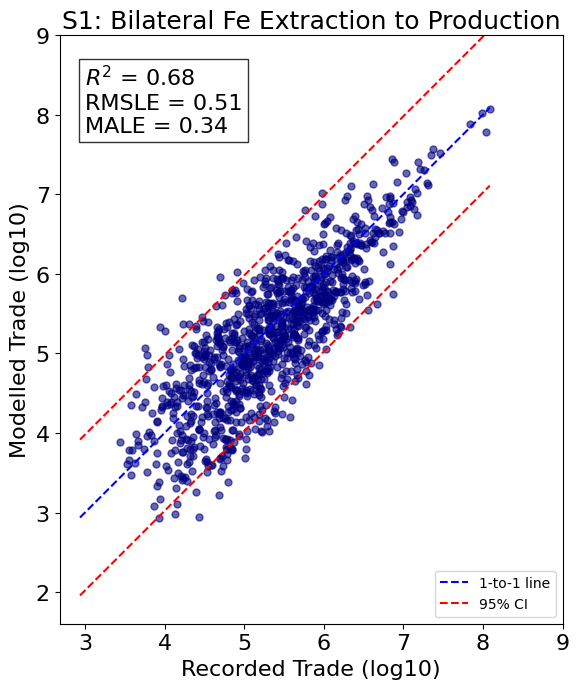

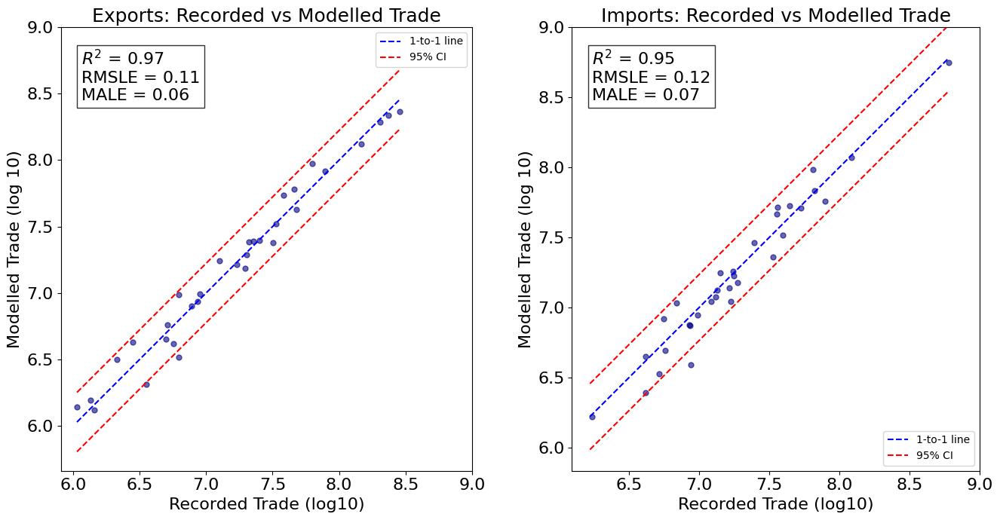

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2008.nc
Top 1,500 edges cover 22.49% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2008.png


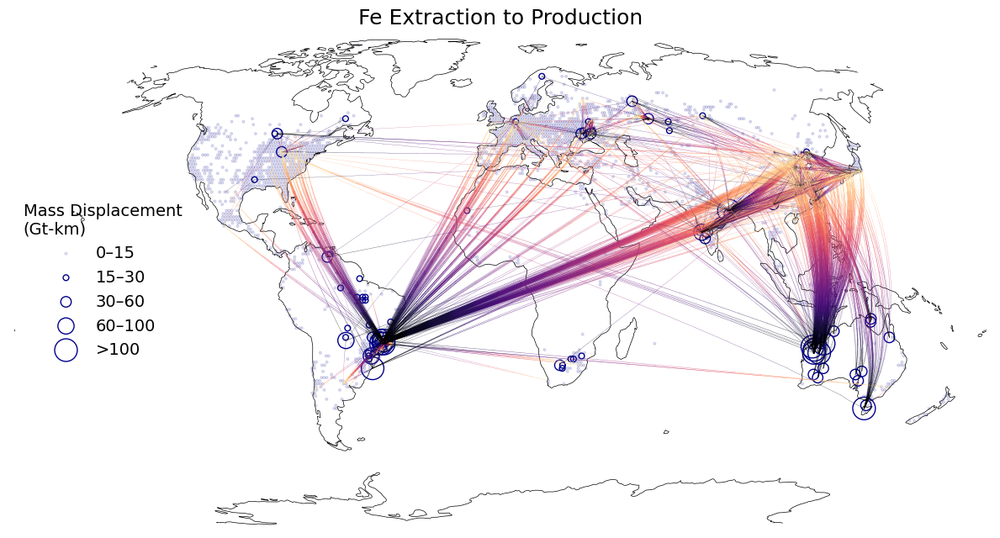

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14883.07
Edges after gravity calculation: 7411808
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7411808
IPF complete. Flow matrix generated with 7411808 edges.


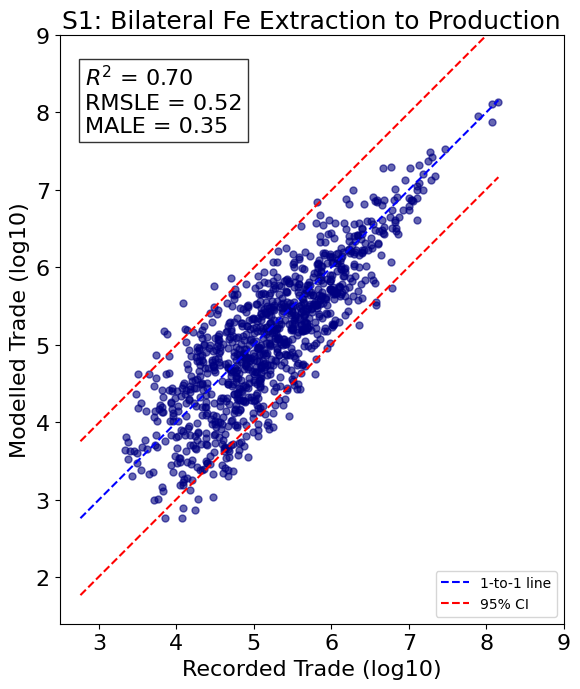

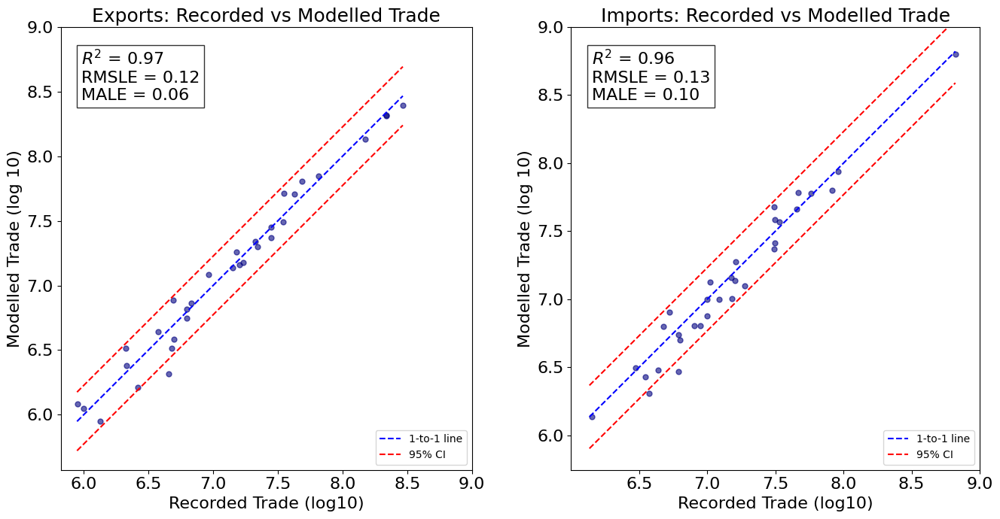

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2009.nc
Top 1,500 edges cover 24.61% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2009.png


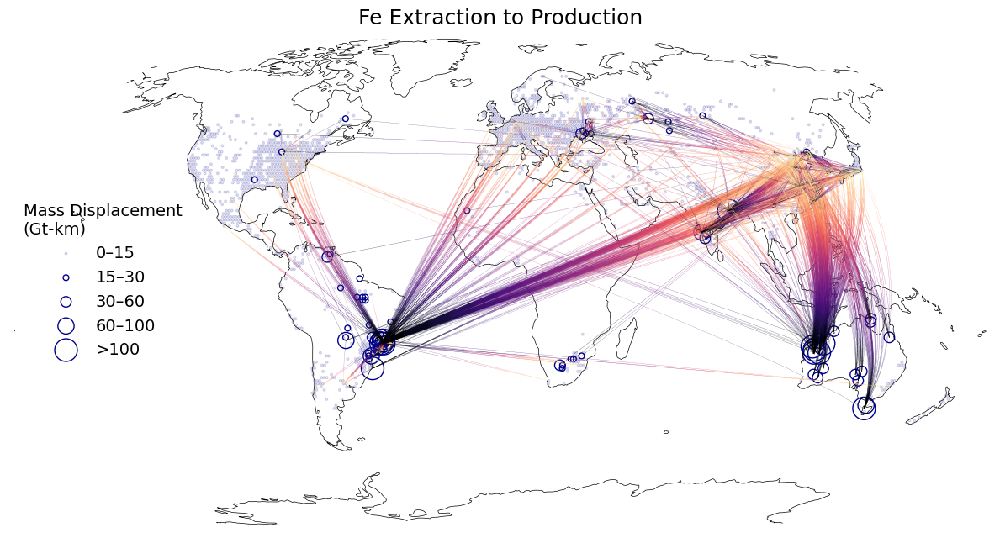

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14597.83
Edges after gravity calculation: 7469984
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7469984
IPF complete. Flow matrix generated with 7469984 edges.


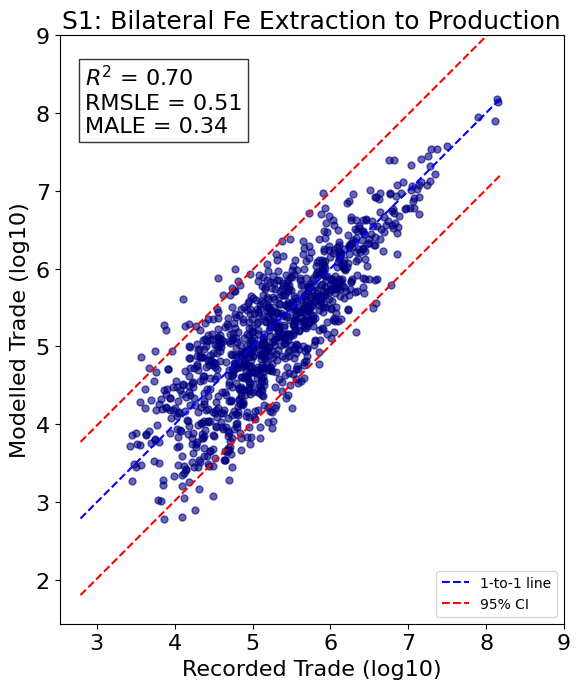

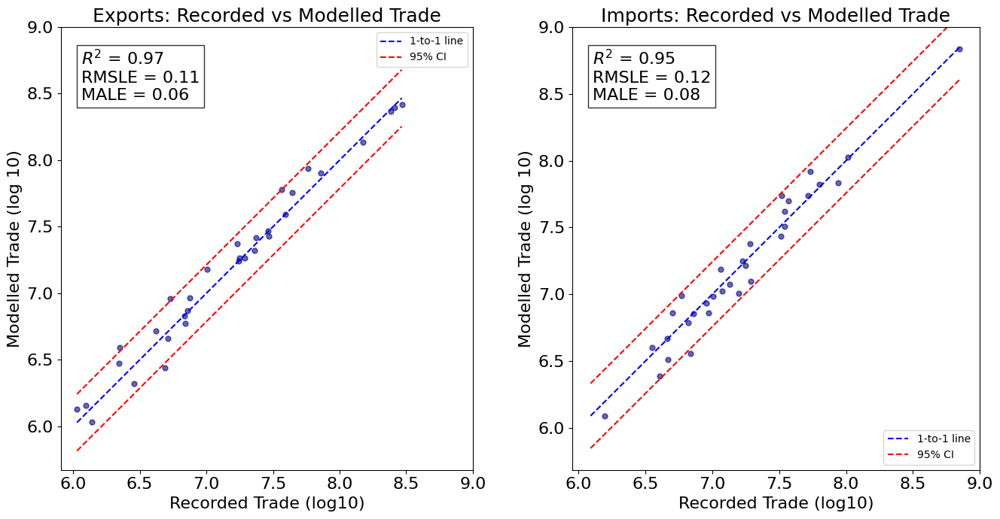

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2010.nc
Top 1,500 edges cover 23.55% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2010.png


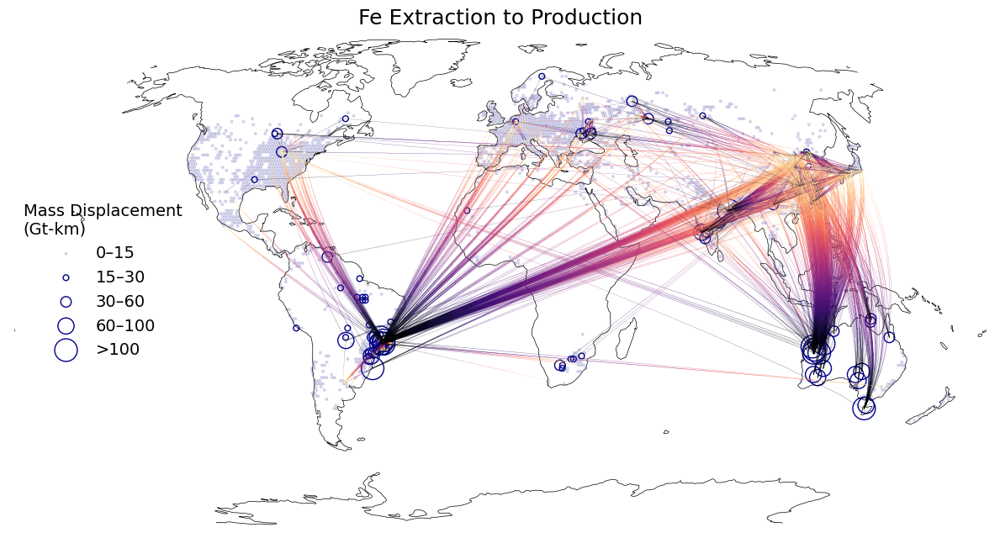

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14521.61
Edges after gravity calculation: 7523381
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7523381
IPF complete. Flow matrix generated with 7523381 edges.


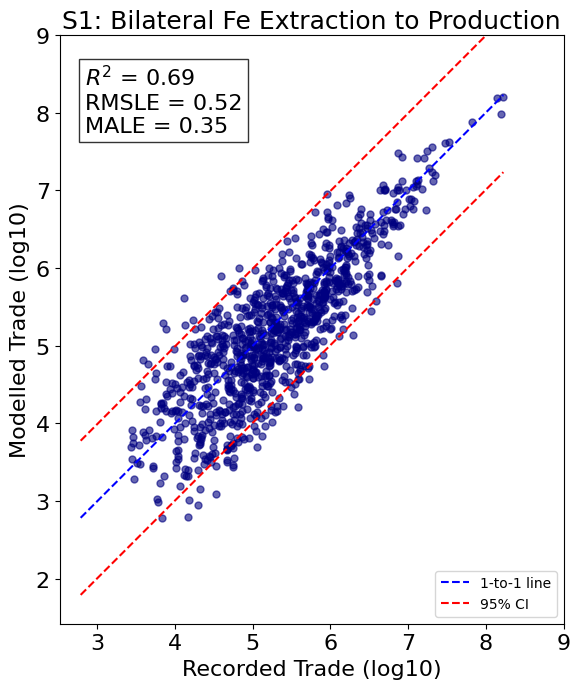

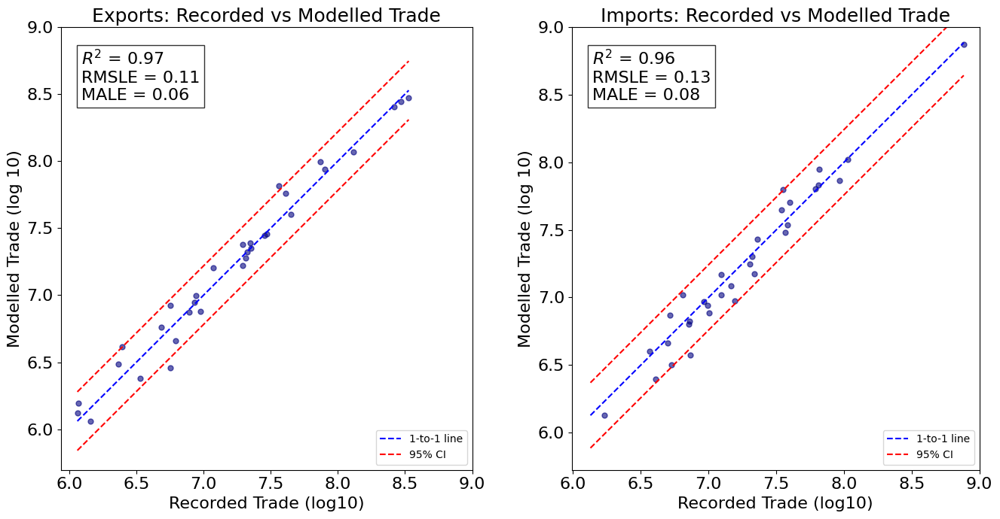

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2011.nc
Top 1,500 edges cover 23.31% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2011.png


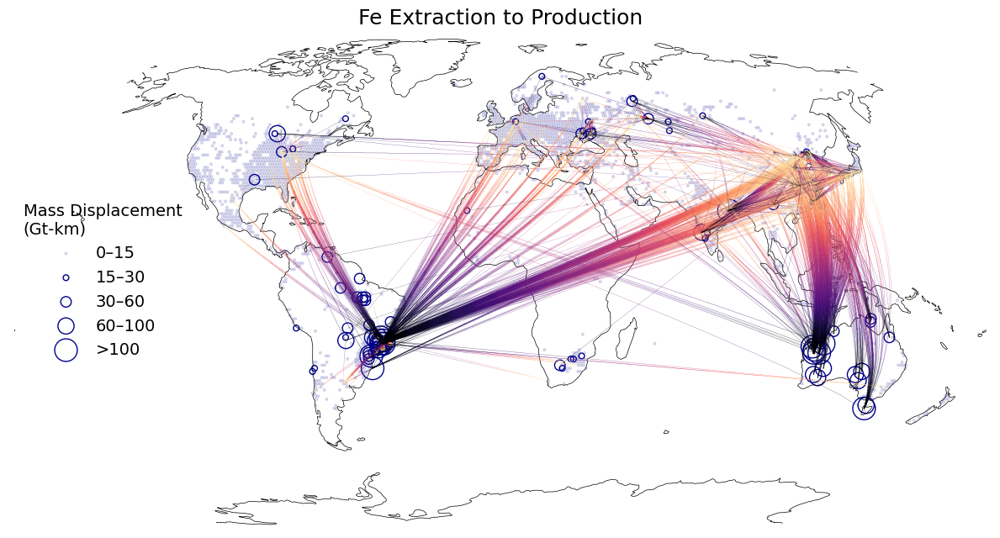

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14473.75
Edges after gravity calculation: 7578775
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7578775
IPF complete. Flow matrix generated with 7578775 edges.


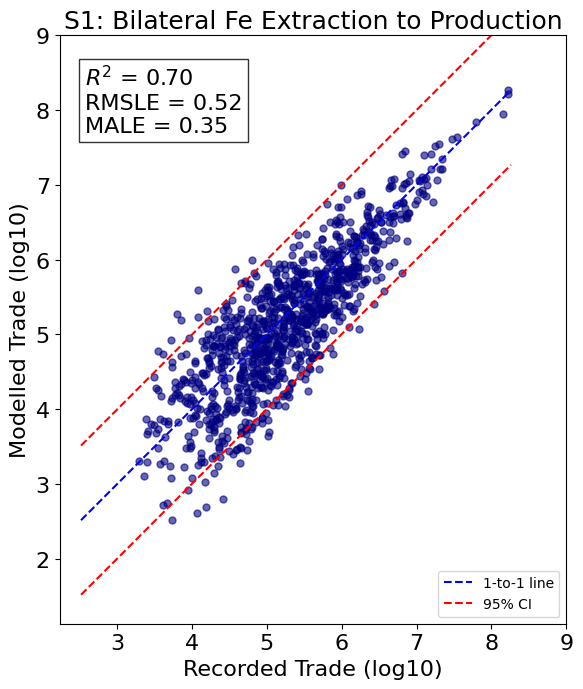

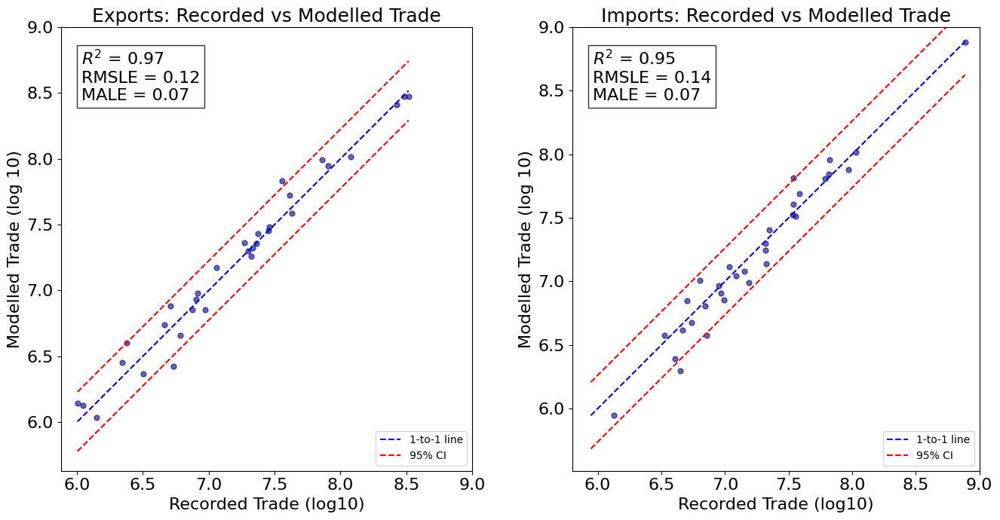

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2012.nc
Top 1,500 edges cover 23.47% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2012.png


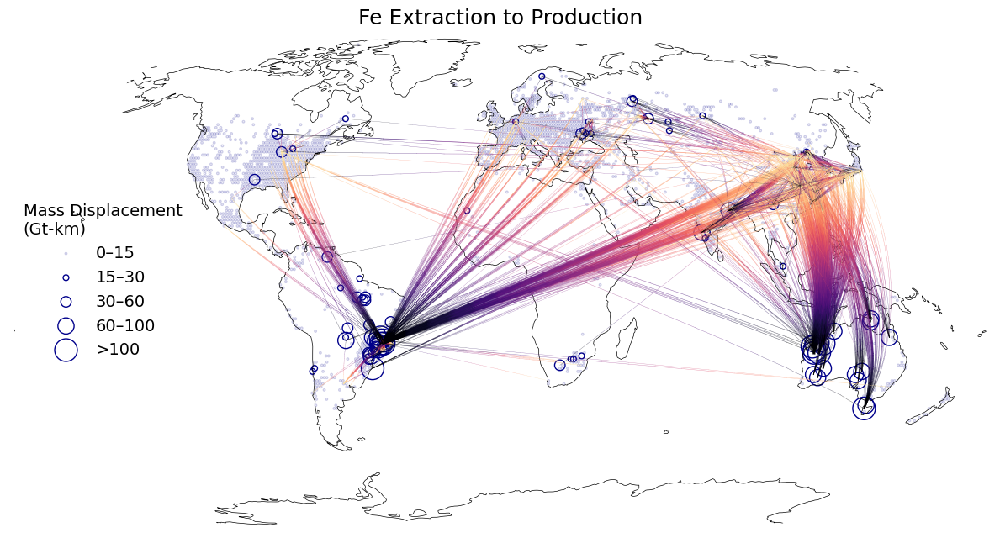

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14652.74
Edges after gravity calculation: 7747678
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7747678
IPF complete. Flow matrix generated with 7747678 edges.


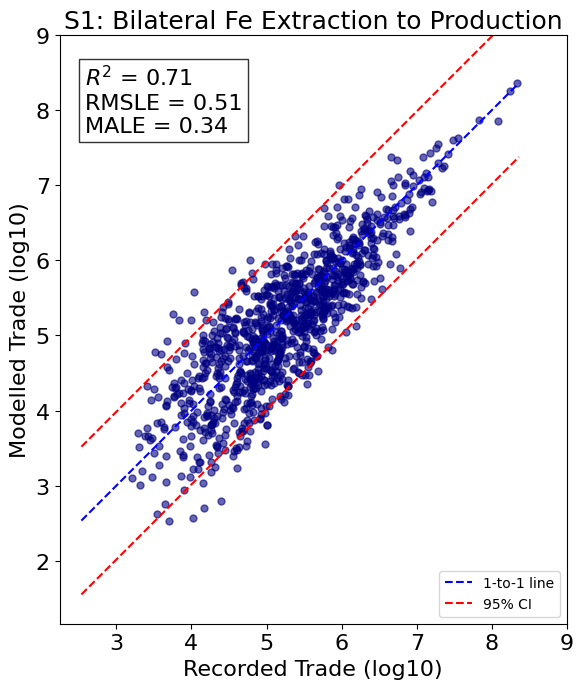

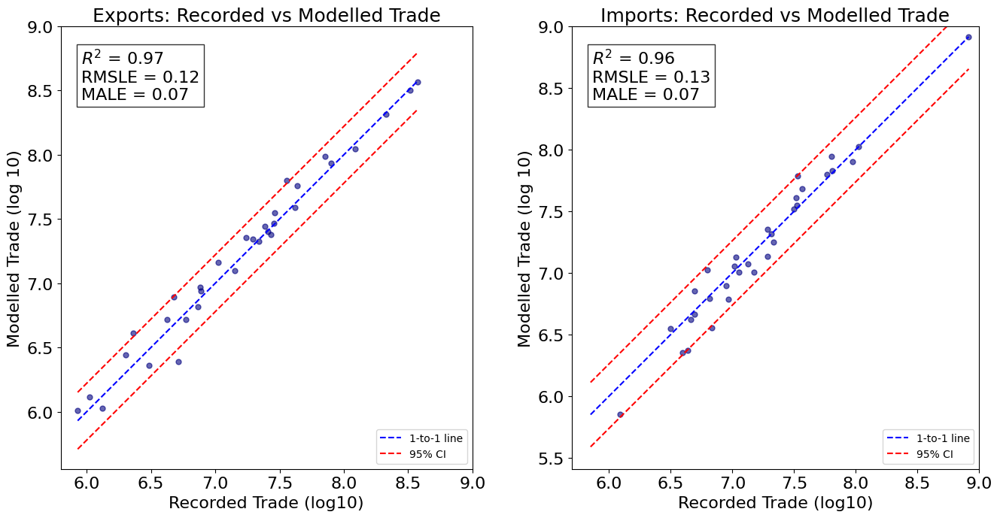

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2013.nc
Top 1,500 edges cover 23.89% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2013.png


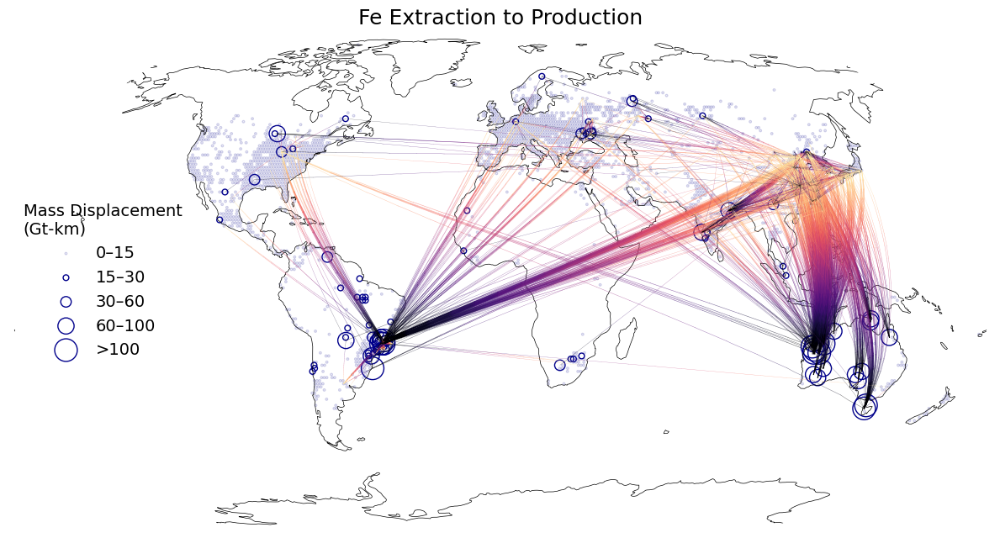

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14641.42
Edges after gravity calculation: 7838308
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7838308
IPF complete. Flow matrix generated with 7838308 edges.


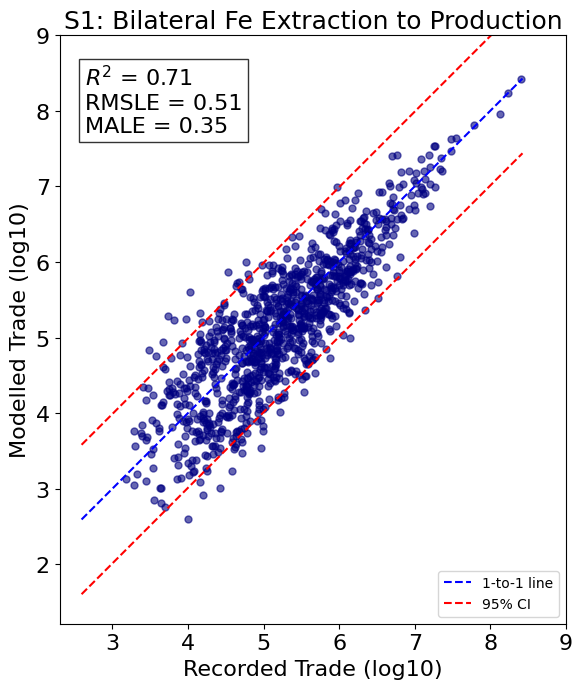

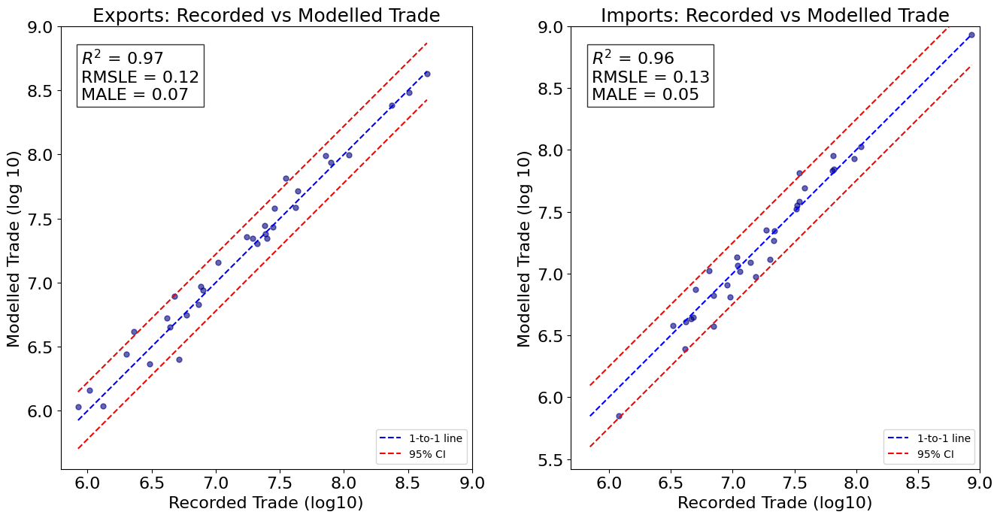

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2014.nc
Top 1,500 edges cover 25.15% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2014.png


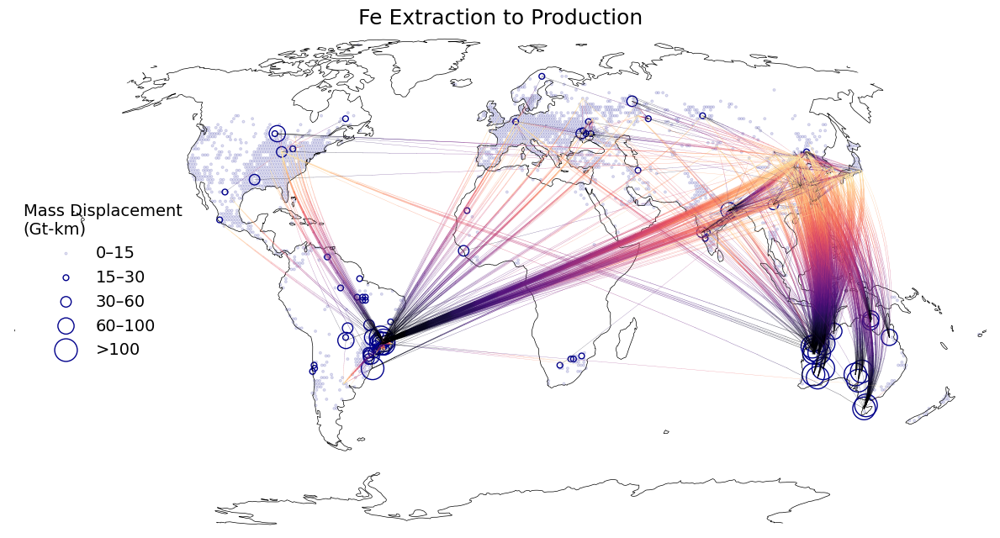

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14809.24
Edges after gravity calculation: 7896088
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7896088
IPF complete. Flow matrix generated with 7896088 edges.


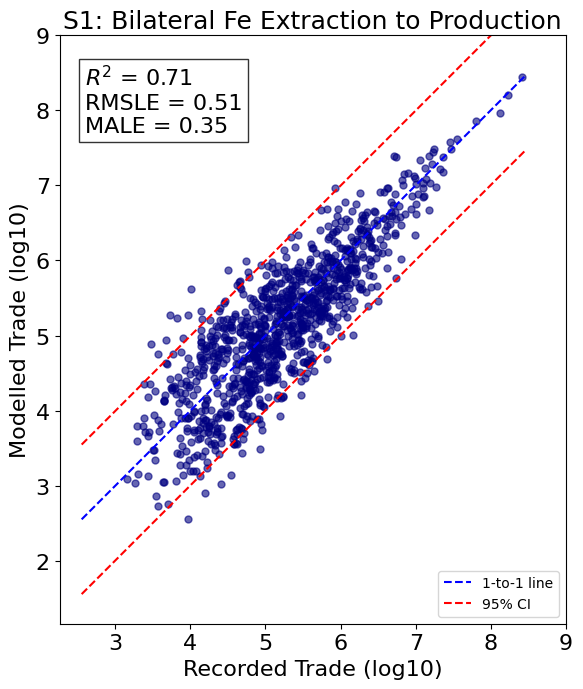

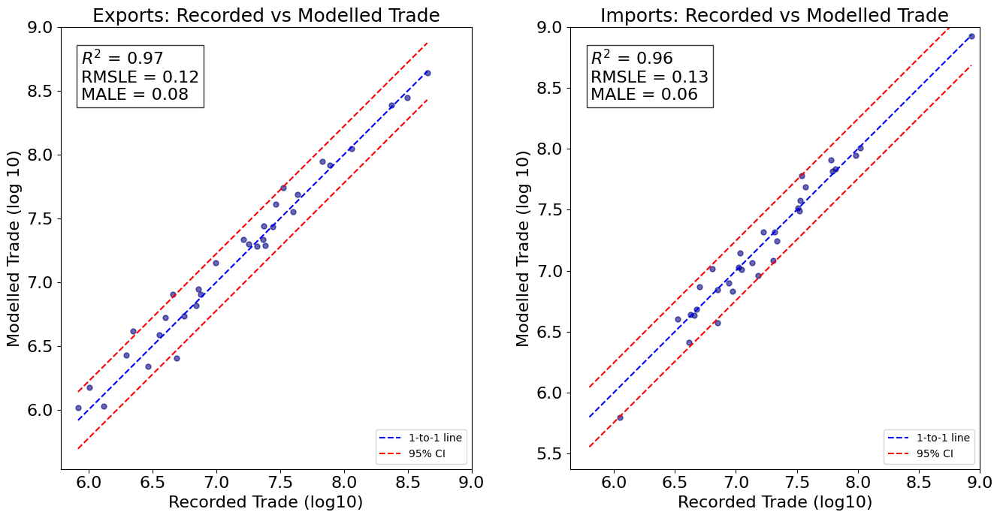

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2015.nc
Top 1,500 edges cover 26.13% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2015.png


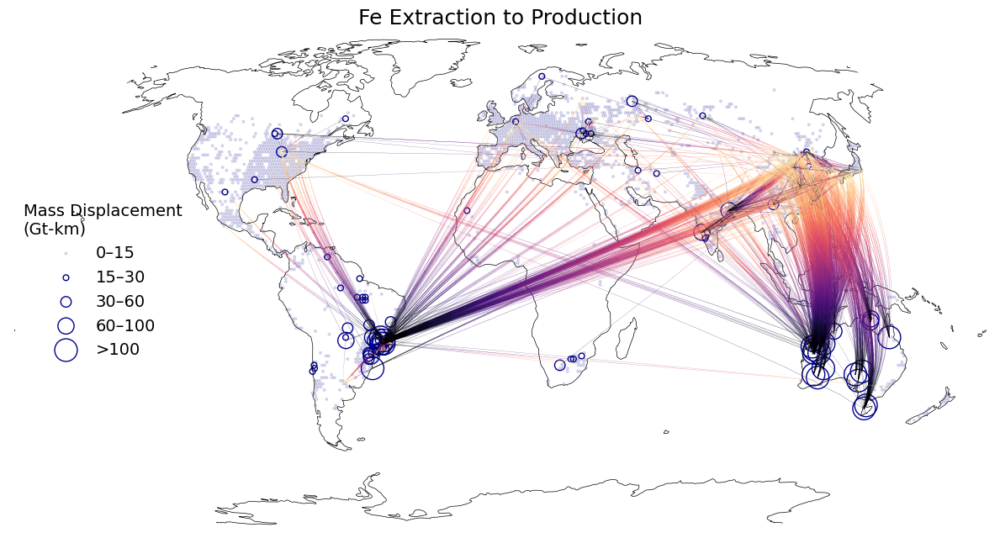

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14940.56
Edges after gravity calculation: 7965052
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7965052
IPF complete. Flow matrix generated with 7965052 edges.


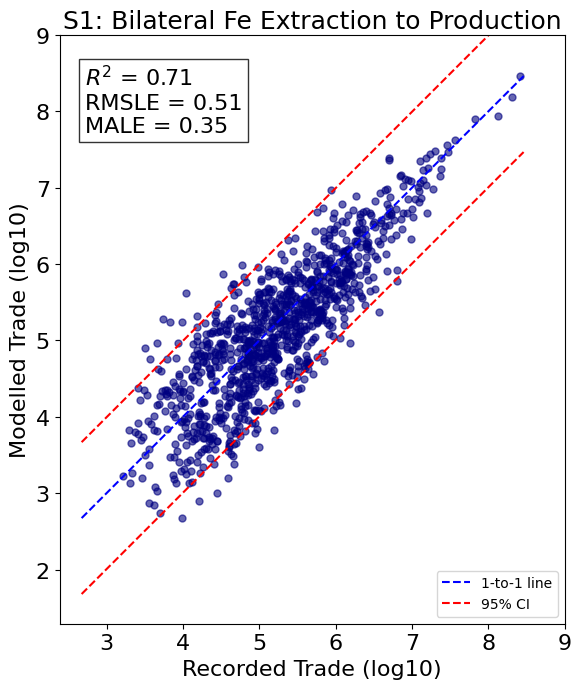

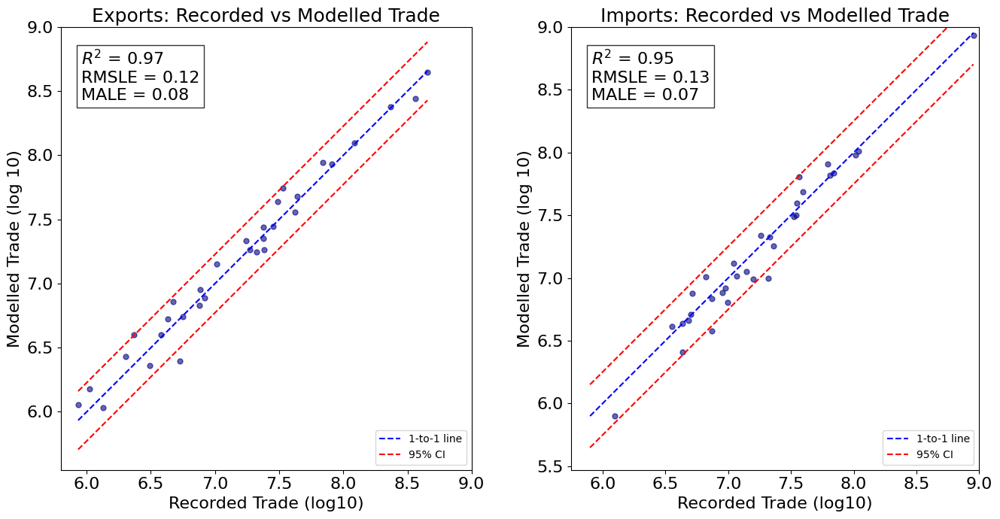

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2016.nc
Top 1,500 edges cover 26.08% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2016.png


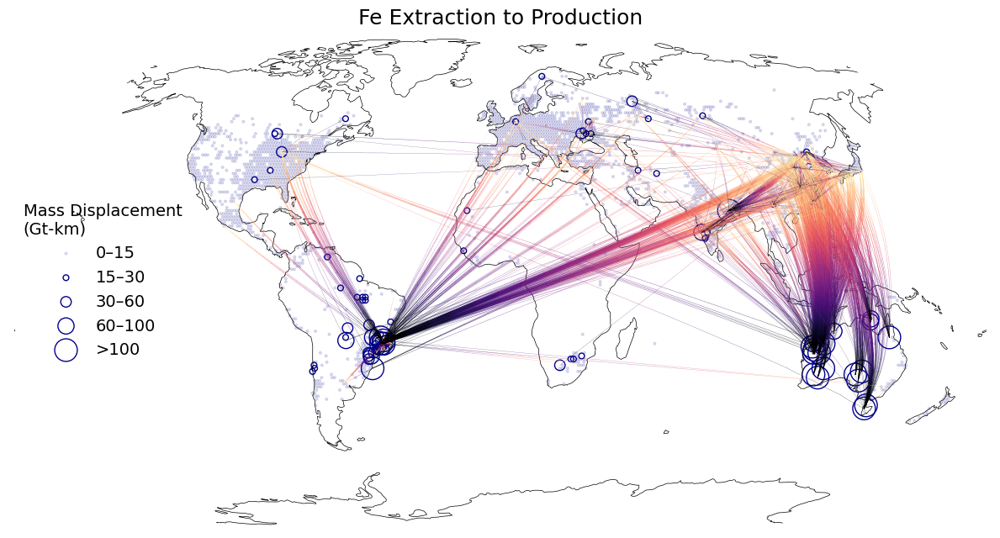

In [75]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_1_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

bilateral_dfs = []
bilateral_metrics = []
regional_metrics = []
year_list = list(range(2008, 2017, 1))

for year in year_list:
    fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time=year)
    fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
    fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
    fn.bilateral_flow(year, json_path)
    df, metrics_bilateral = fn.validate_bilateral(bilateral_csv_path, year=year, column='tonnes_adj_1', x_log=True, y_log=True, title="S1: Bilateral Fe Extraction to Production", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log10)", fontsize=16, xmax=9, ymax=9, output_dir=plot_path, filename=f"bilateral_trade_s1_{year}.pdf")
    df.to_csv(output_path + "model_output_s1_{year}.csv", index=False)
    metrics_regional = fn.regional_trade_comparison(x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log 10)", fontsize=16, xmax=9, ymax=9, rm_outliers=False, output_dir=plot_path, filename=f"regional_trade_s1_{year}.pdf")
    fn.save_to_netcdf(output_dir=output_path, filename=f"gravity_model_output_s1_{year}.nc")
    fn.mass_displacement(output_dir=output_path, filename=f"gravity_mass_displacement_s1_{year}.nc")
    fn.plot_network_map(title="Fe Extraction to Production", radius=3, color="darkblue", bins=[0.1, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=1500, edge_alpha=0.6, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s1_{year}.png")
    bilateral_metrics.append(metrics_bilateral)
    regional_metrics.append(metrics_regional)
    bilateral_dfs.append(df)

merged_bilateral = pd.concat(bilateral_metrics)
merged_regional = pd.concat(regional_metrics)
merged_regional_dfs = pd.concat(bilateral_dfs)

merged_bilateral.to_csv(output_path + "bilateral_validation_s1.csv", index=False)
merged_regional.to_csv(output_path + "regional_validation_s1.csv", index=False)
merged_regional_dfs.to_csv(output_path + "model_output_s1.csv", index=False)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 16352.73
Edges after gravity calculation: 7313731
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7313731
IPF complete. Flow matrix generated with 7313731 edges.


UnboundLocalError: cannot access local variable 'rmsle' where it is not associated with a value

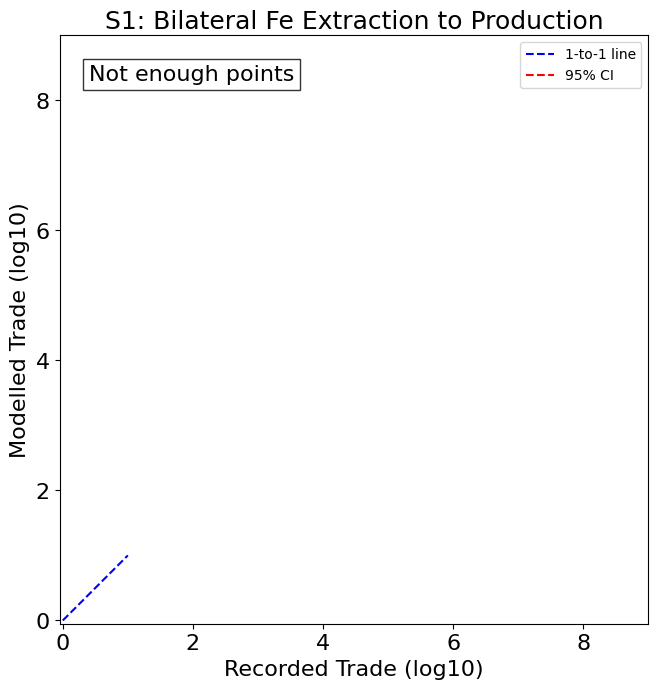

In [59]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_1_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

bilateral_dfs = []
bilateral_metrics = []
regional_metrics = []
year_list = list(range(2008, 2017, 1))

for year in year_list:
    fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time=year)
    fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
    fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
    fn.bilateral_flow(year, json_path)    
    df, metrics_bilateral = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, title="S1: Bilateral Fe Extraction to Production", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log10)", fontsize=16, xmax=9, ymax=9)
    metrics_regional = fn.regional_trade_comparison(x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log 10)", fontsize=16, xmax=9, ymax=9, rm_outliers=False, output_dir=plot_path, filename=f"regional_trade_s1_{year}.pdf")
    fn.save_to_netcdf(output_dir=netcdf_path, filename=f"gravity_model_output_s1_{year}.nc")
    fn.mass_displacement(output_dir=netcdf_path, filename=f"gravity_mass_displacement_s1_{year}.nc")
    fn.plot_network_map(title="Fe Extraction to Production", radius=3, color="darkblue", bins=[0.1, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=1500, edge_alpha=0.6, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s1_{year}.png")
    bilateral_metrics.append(metrics_bilateral)
    regional_metrics.append(metrics_regional)
    bilateral_dfs.append(df)

merged_bilateral = pd.concat(bilateral_metrics)
merged_regional = pd.concat(regional_metrics)
merged_regional_dfs = pd.concat(bilateral_dfs)

merged_bilateral.to_csv(output_path + "bilateral_validation_s1.csv", index=False)
merged_regional.to_csv(output_path + "regional_validation_s1.csv", index=False)
merged_regional_dfs.to_csv(output_path + "model_output_s1.csv", index=False)

# Stage 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 16728.40
Edges after gravity calculation: 7305902
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7305902
IPF complete. Flow matrix generated with 7305902 edges.


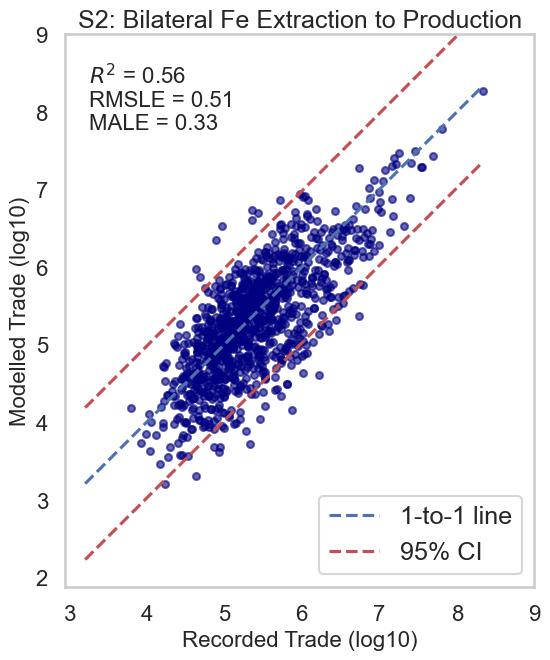

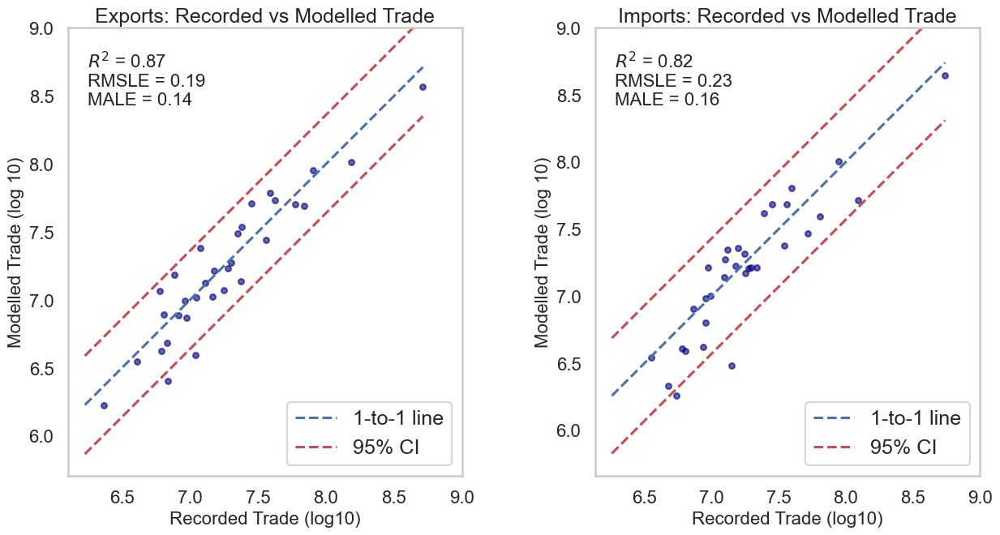

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2008.nc
Top 3,000 edges cover 16.83% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s2_2008.png


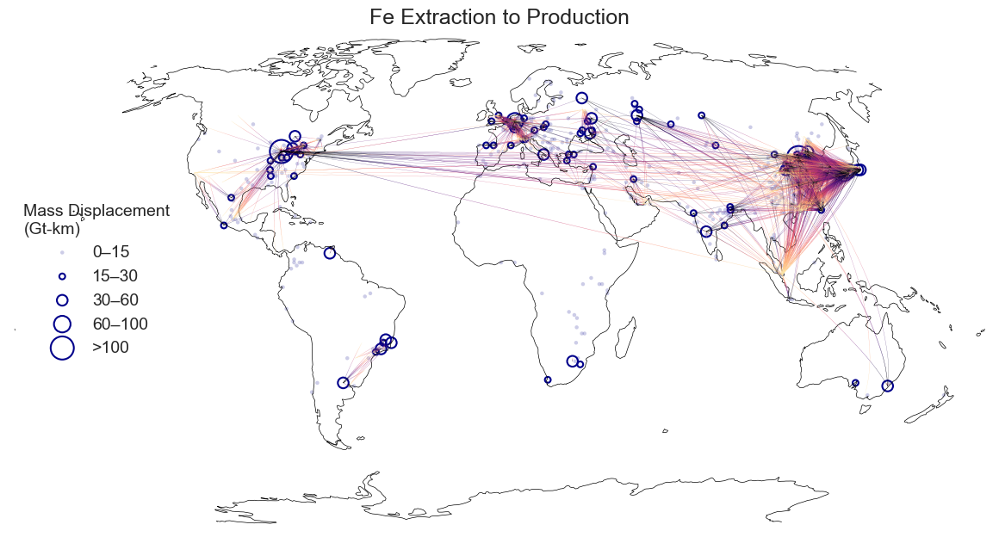

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15247.89
Edges after gravity calculation: 7403874
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7403874
IPF complete. Flow matrix generated with 7403874 edges.


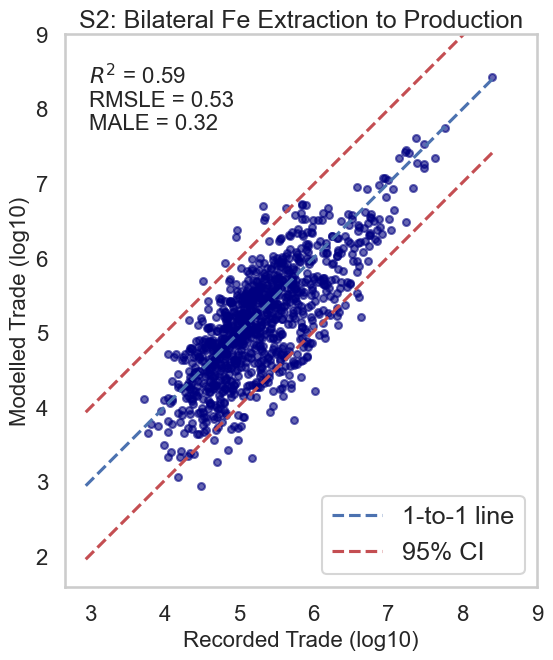

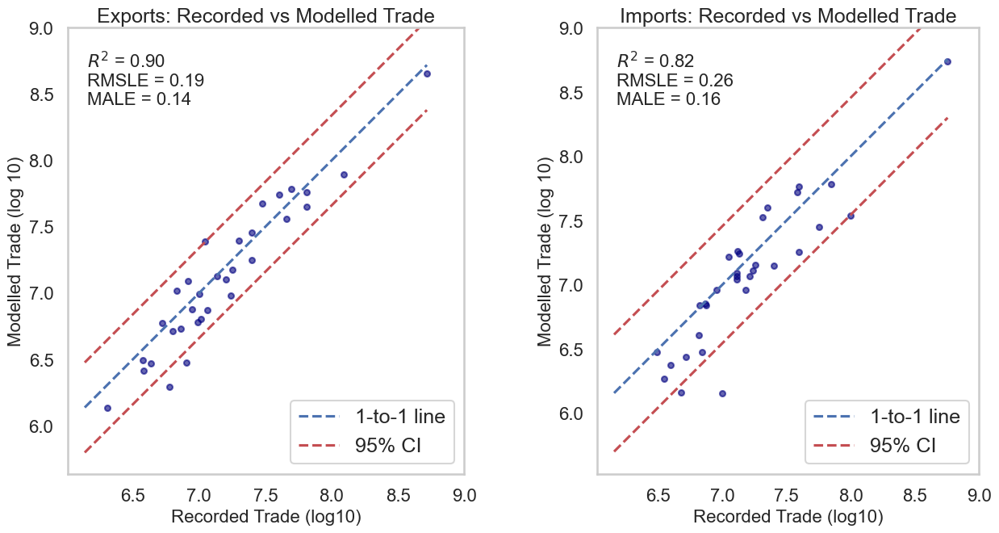

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2009.nc
Top 3,000 edges cover 18.30% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s2_2009.png


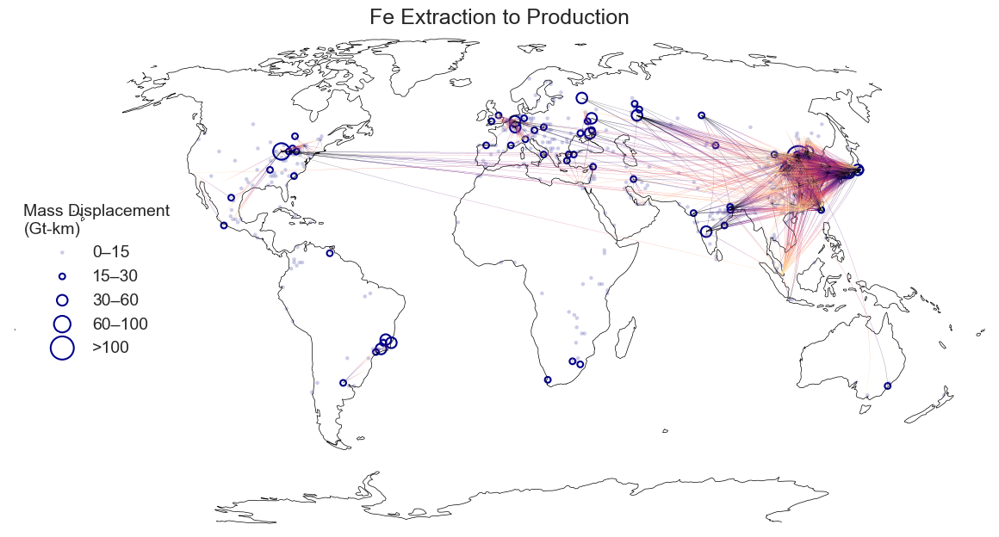

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14788.78
Edges after gravity calculation: 7461990
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7461990
IPF complete. Flow matrix generated with 7461990 edges.


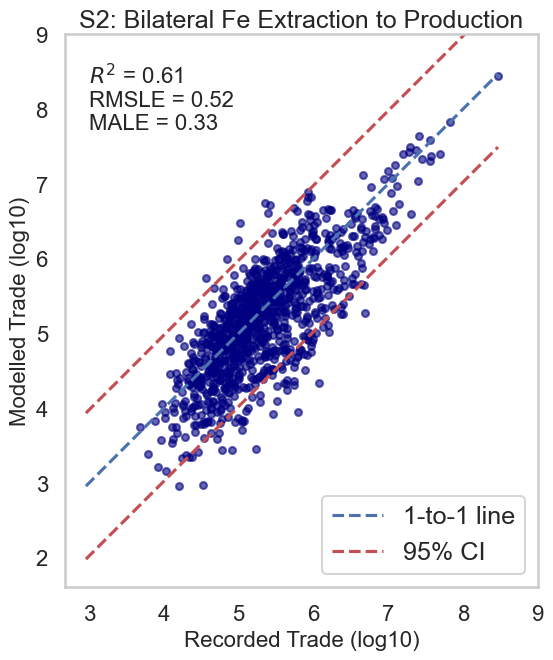

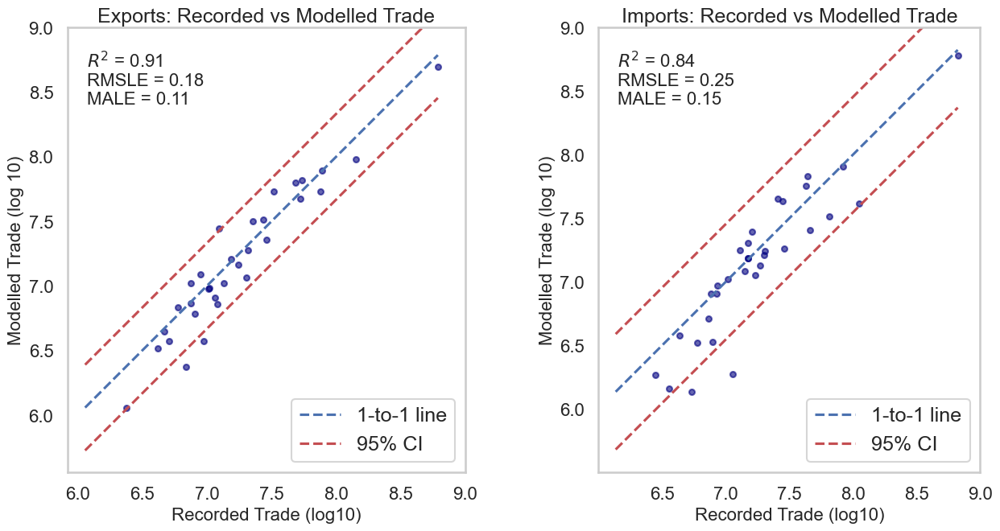

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2010.nc
Top 3,000 edges cover 17.35% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s2_2010.png


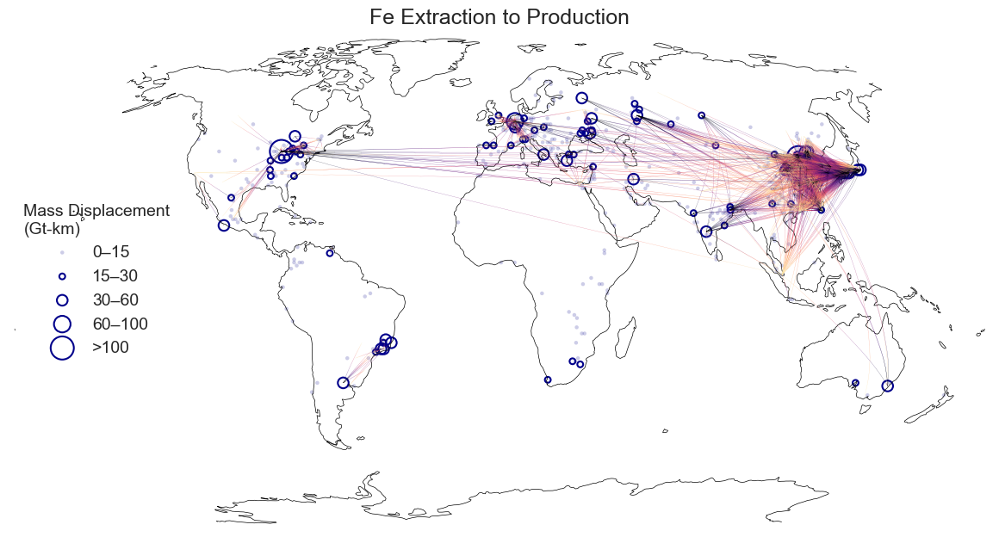

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14744.36
Edges after gravity calculation: 7515312
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7515312
IPF complete. Flow matrix generated with 7515312 edges.


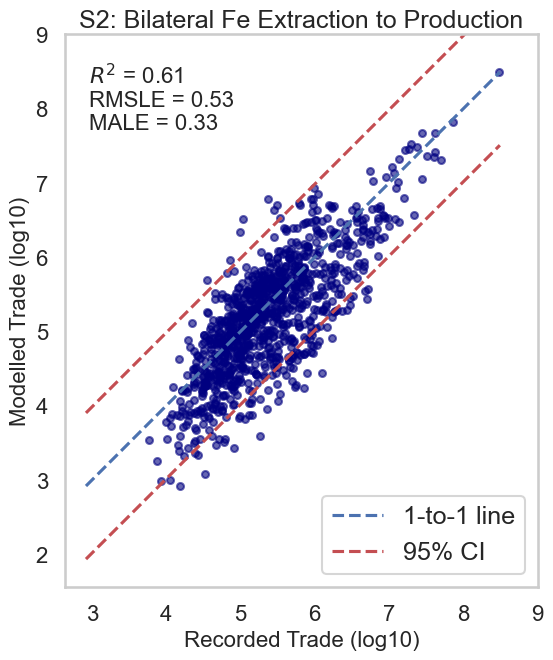

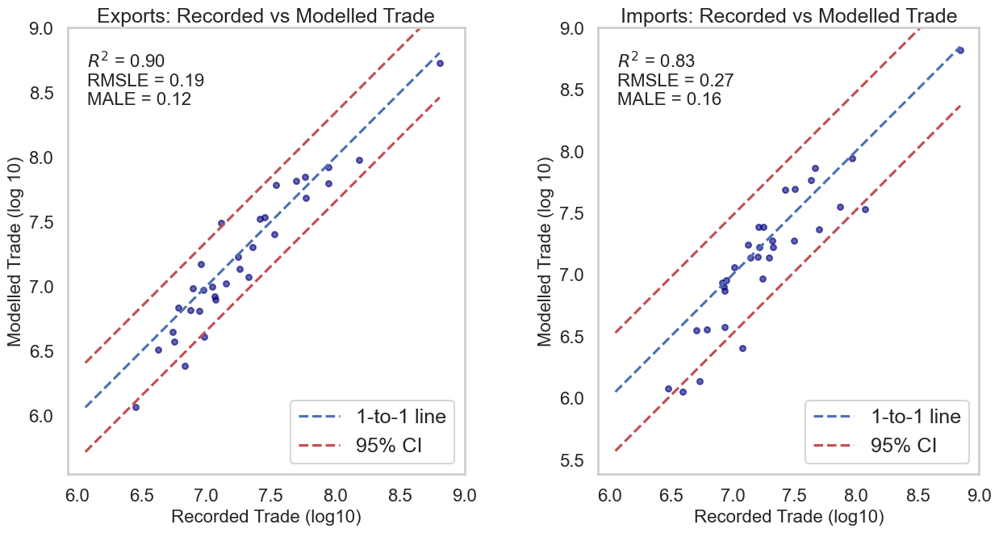

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2011.nc
Top 3,000 edges cover 17.48% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s2_2011.png


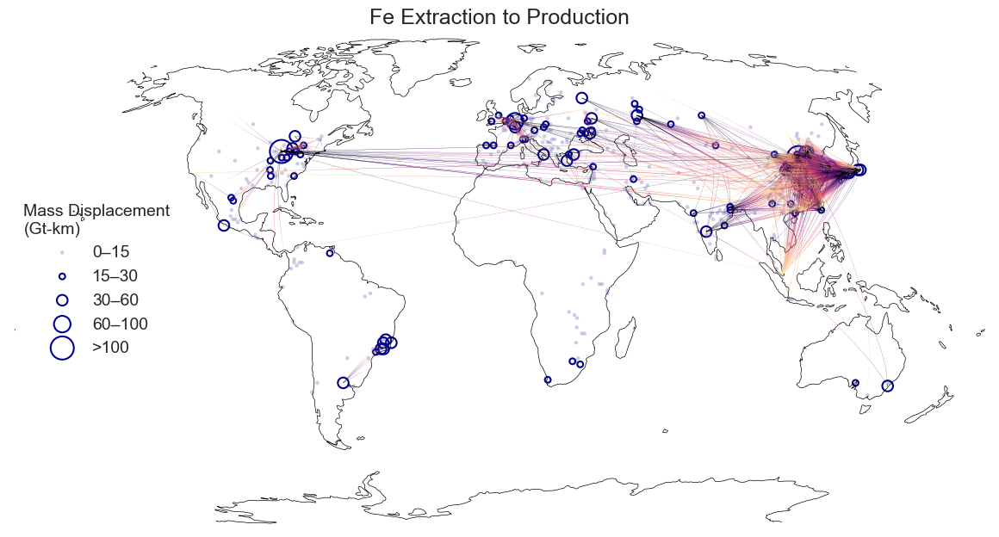

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14765.16
Edges after gravity calculation: 7570646
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7570646
IPF complete. Flow matrix generated with 7570646 edges.


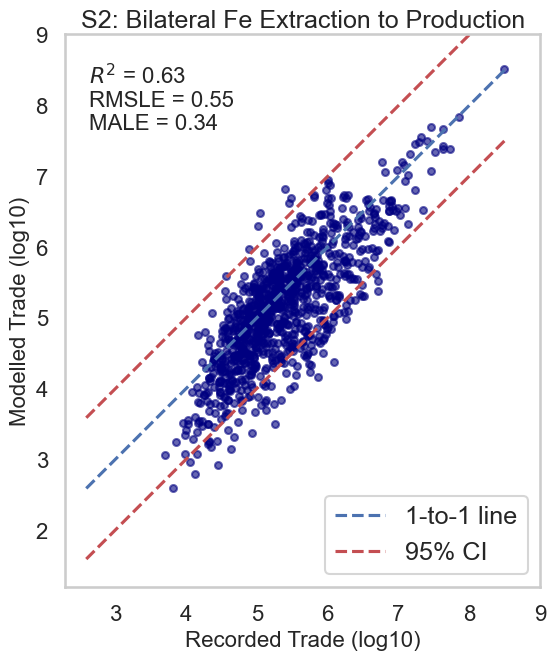

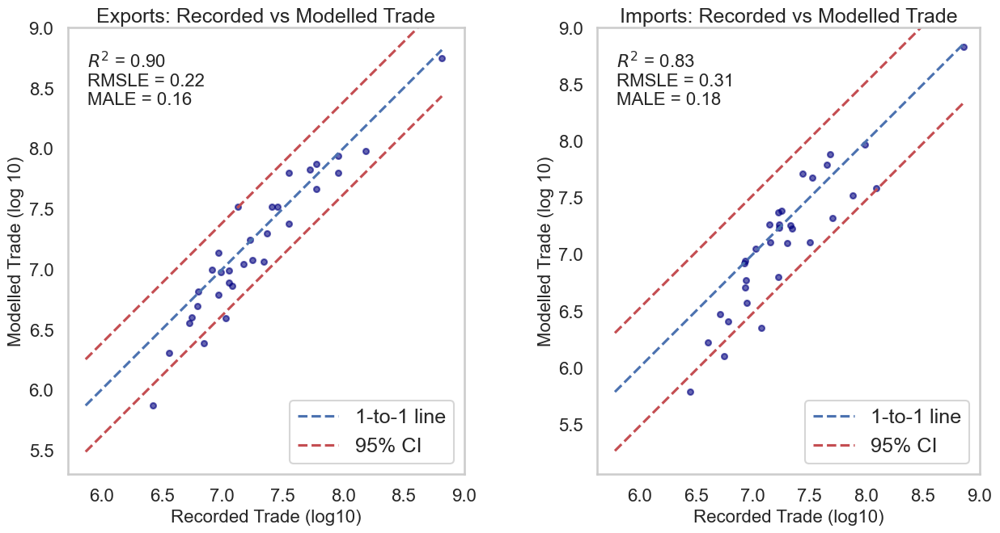

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2012.nc
Top 3,000 edges cover 17.49% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s2_2012.png


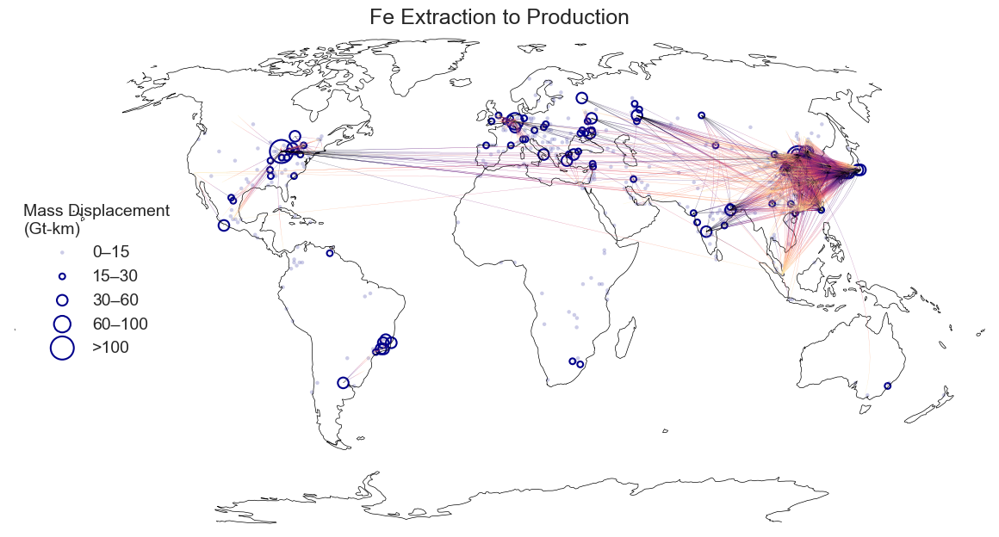

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14814.35
Edges after gravity calculation: 7739369
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7739369
IPF complete. Flow matrix generated with 7739369 edges.


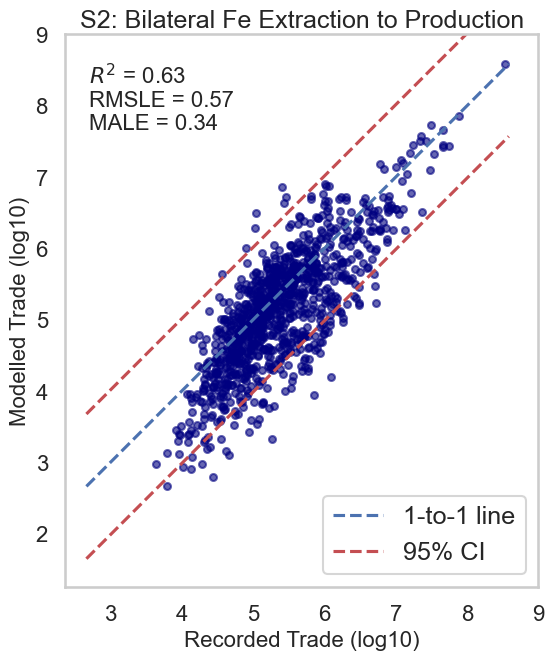

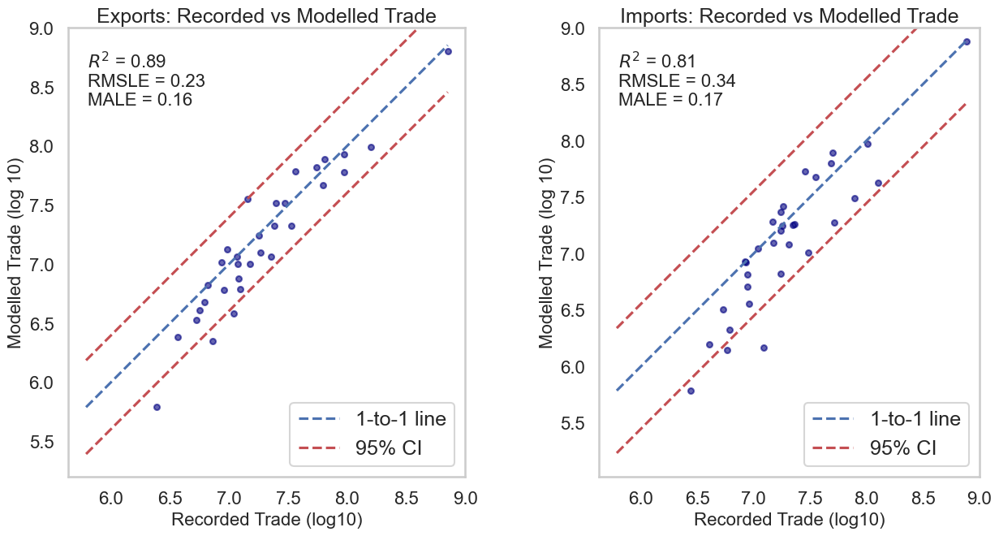

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2013.nc
Top 3,000 edges cover 18.15% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s2_2013.png


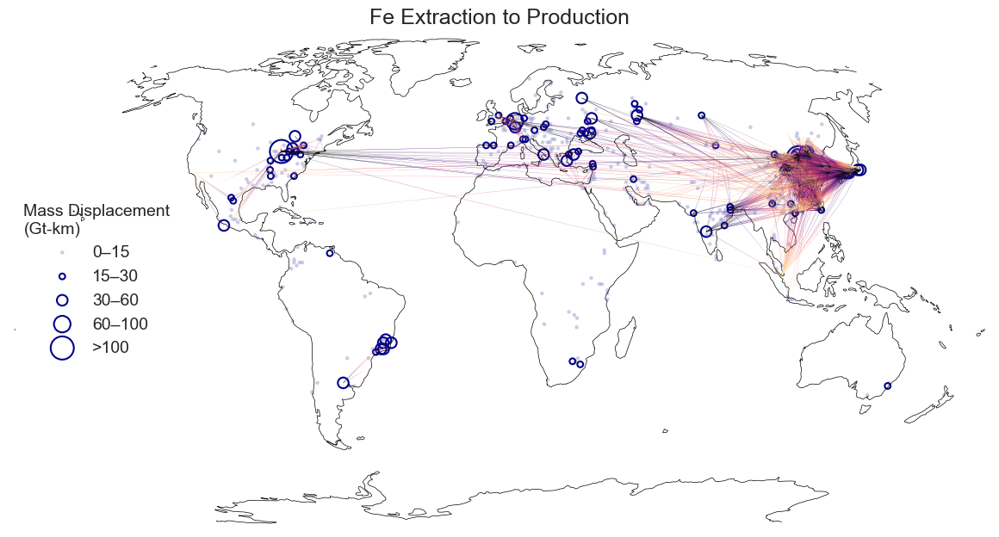

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14827.63
Edges after gravity calculation: 7829909
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7829909
IPF complete. Flow matrix generated with 7829909 edges.


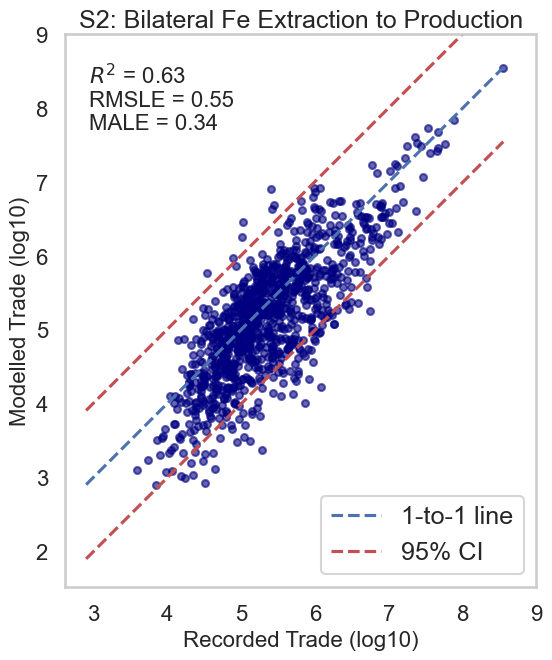

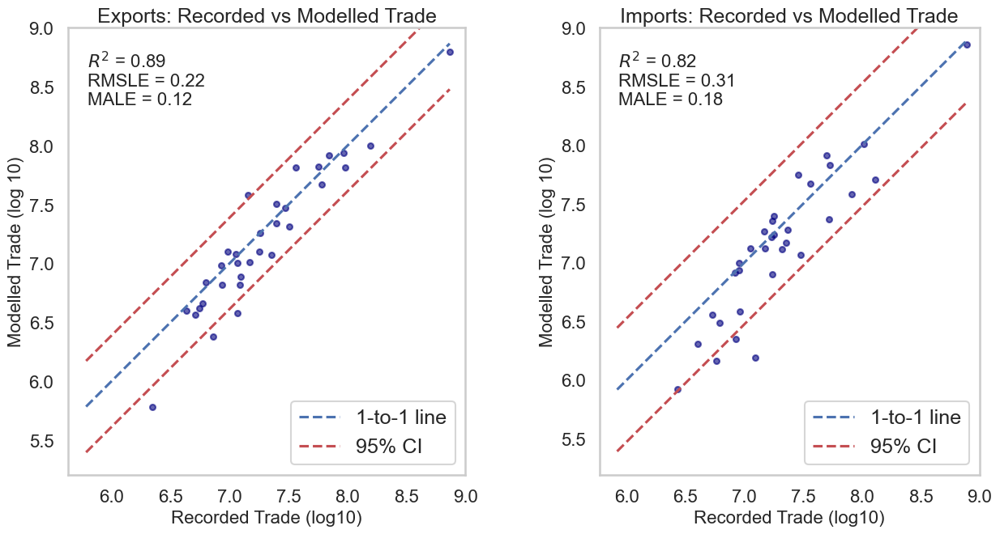

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2014.nc
Top 3,000 edges cover 17.70% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s2_2014.png


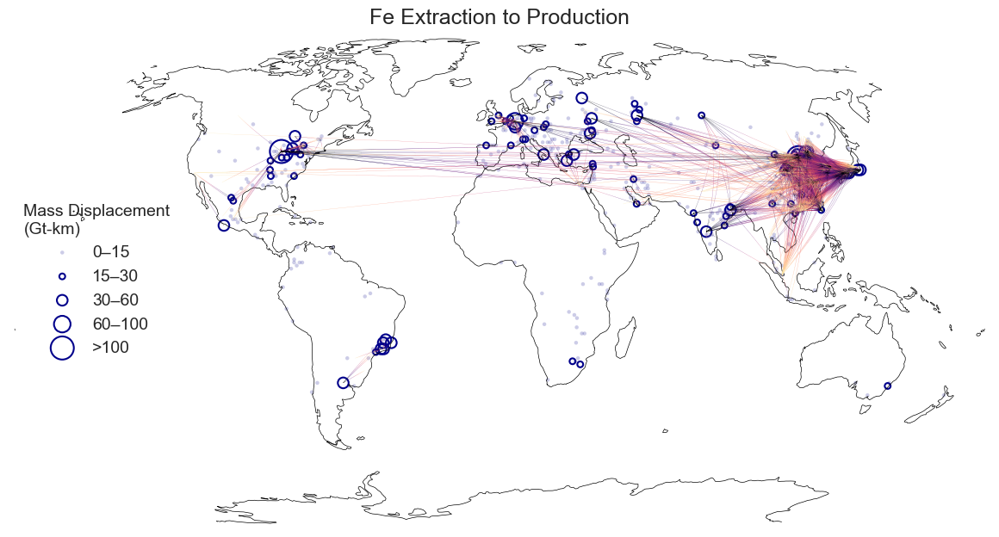

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15096.34
Edges after gravity calculation: 7887659
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7887659
IPF complete. Flow matrix generated with 7887659 edges.


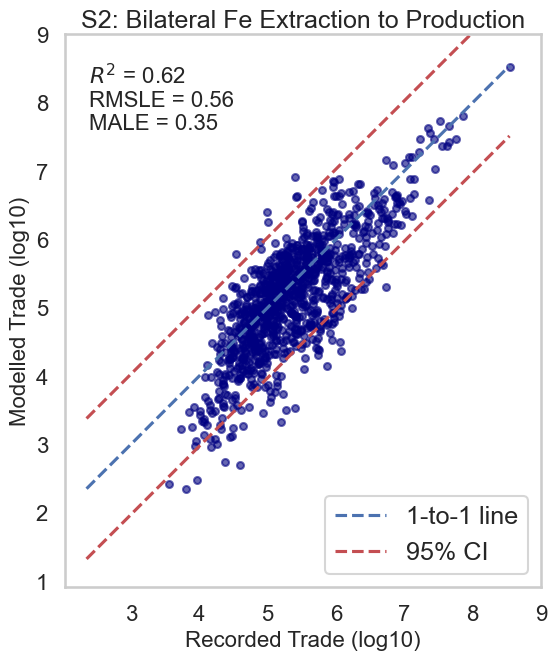

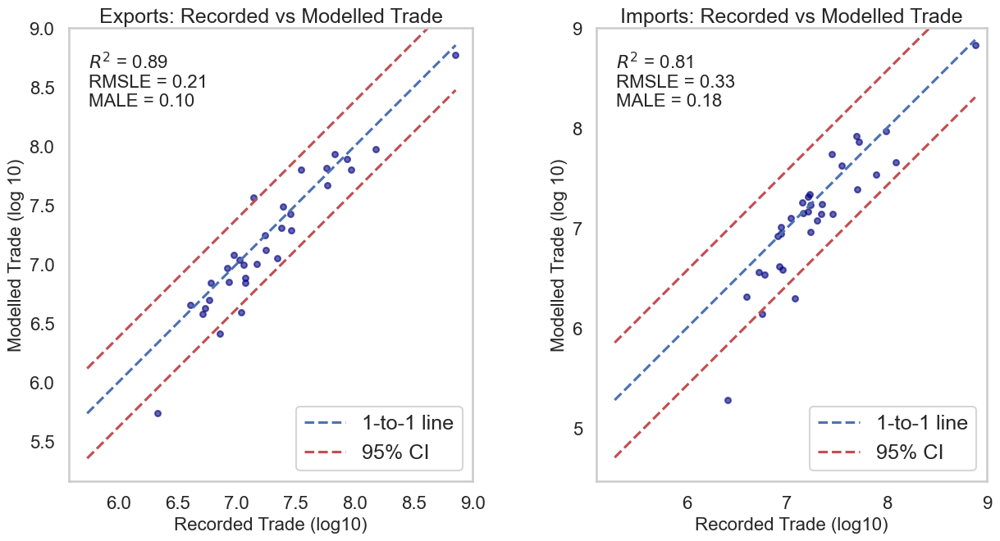

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2015.nc
Top 3,000 edges cover 17.49% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s2_2015.png


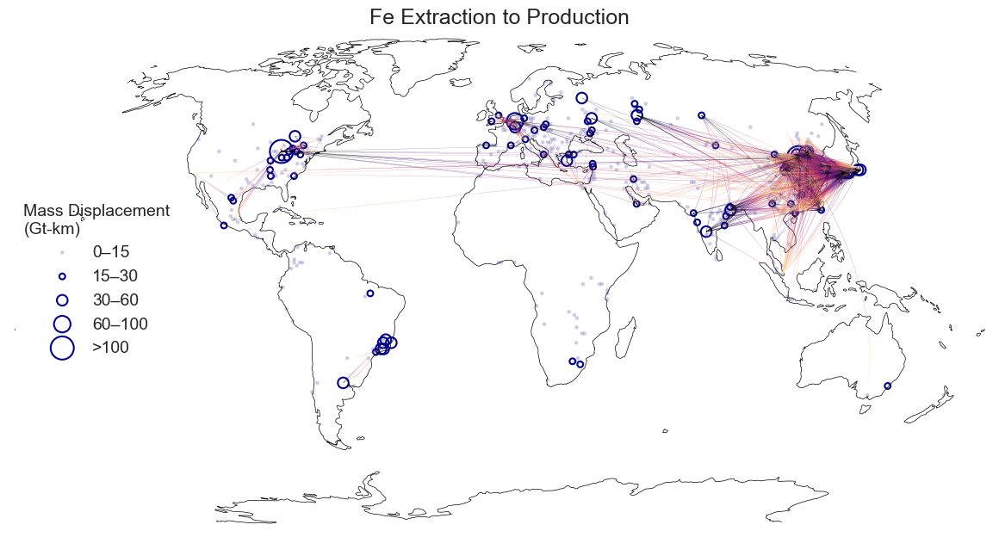

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15161.50
Edges after gravity calculation: 7956533
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7956533
IPF complete. Flow matrix generated with 7956533 edges.


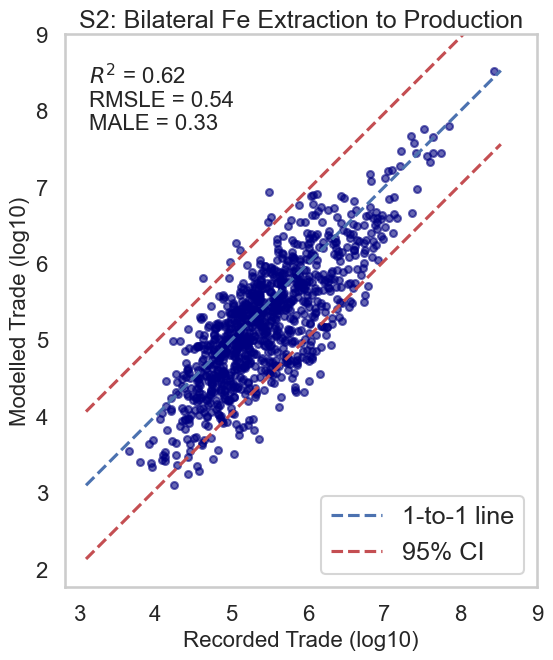

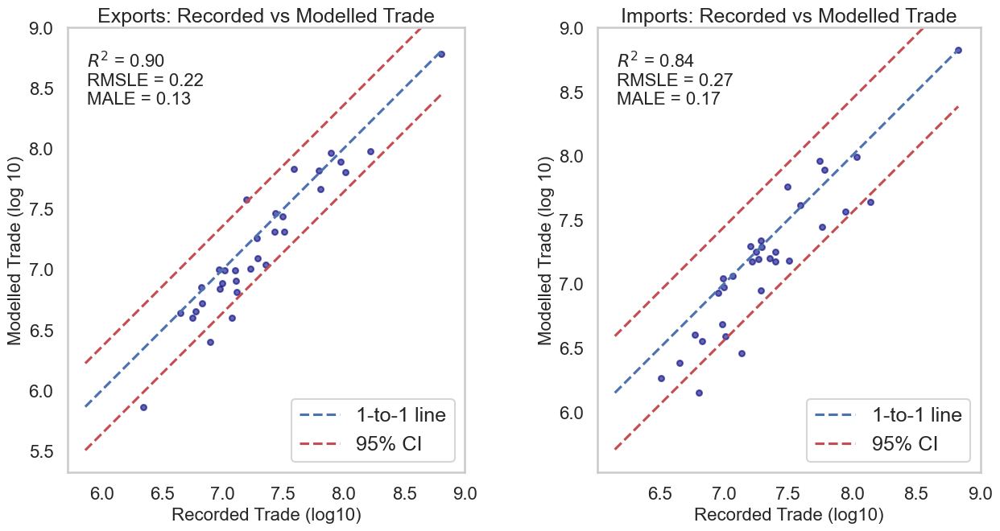

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2016.nc
Top 3,000 edges cover 17.27% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s2_2016.png


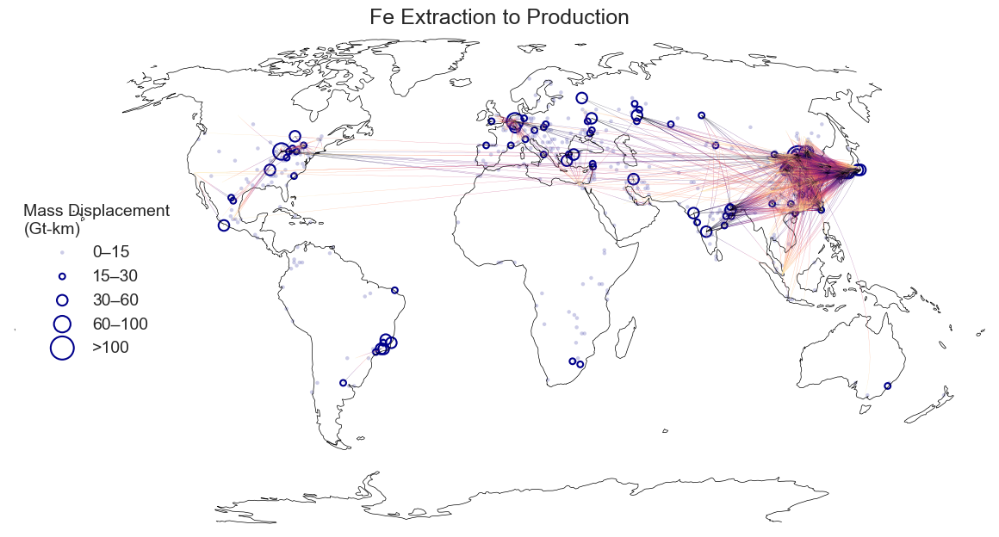

In [8]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_2_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

bilateral_dfs = []
bilateral_metrics = []
regional_metrics = []
year_list = list(range(2008, 2017, 1))

for year in year_list:
    fn = FlowNetwork(grid_data_path, 'source_2_adj', 'sink_2_adj', time=year)
    fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
    fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
    fn.bilateral_flow(year, json_path)
    df, metrics_bilateral = fn.validate_bilateral(bilateral_csv_path, year=year, column='tonnes_adj_2', x_log=True, y_log=True, title="S2: Bilateral Fe Extraction to Production", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log10)", fontsize=16, xmax=9, ymax=9, output_dir=plot_path, filename=f"bilateral_trade_s2_{year}.pdf")
    df.to_csv(output_path + f"model_output_s2_{year}.csv", index=False)
    metrics_regional = fn.regional_trade_comparison(x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log 10)", fontsize=16, xmax=9, ymax=9, rm_outliers=False, output_dir=plot_path, filename=f"regional_trade_s2_{year}.pdf")
    fn.save_to_netcdf(output_dir=output_path, filename=f"gravity_model_output_s2_{year}.nc")
    fn.mass_displacement(output_dir=output_path, filename=f"gravity_mass_displacement_s2_{year}.nc")
    fn.plot_network_map(title="Fe Extraction to Production", radius=3, color="darkblue", bins=[0, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=3000, edge_alpha=0.6, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s2_{year}.png")
    bilateral_metrics.append(metrics_bilateral)
    regional_metrics.append(metrics_regional)
    bilateral_dfs.append(df)

merged_bilateral = pd.concat(bilateral_metrics)
merged_regional = pd.concat(regional_metrics)
merged_regional_dfs = pd.concat(bilateral_dfs)

merged_bilateral.to_csv(output_path + "bilateral_validation_s2.csv", index=False)
merged_regional.to_csv(output_path + "regional_validation_s2.csv", index=False)
merged_regional_dfs.to_csv(output_path + "model_output_s2.csv", index=False)

# Combine NetCDF Files

In [9]:
nc_lists = glob.glob(output_path + "gravity_mass_displacement*")

## add lat and lon attributes
lon_attr = {"units" : "degrees_east",
        "modulo" : 360.,
        "point_spacing" : "even",
        "axis" : "X"}

lat_attr = {"units" : "degrees_north",
            "point_spacing" : "even",
            "axis" : "Y"}

time_attr = {
        "standard_name": "time",
        "axis": "T"}

global_attr = {'Project': 'Surface Earth System Analysis and Modeling Environment (SESAME)',
               'Research Group': 'Integrated Earth System Dynamics',
               'Institution': 'McGill University',
               'Contact': 'eric.galbraith@mcgill.ca \nabdullah-al.faisal@mail.mcgill.ca',
               'Data Version': 'V2.0'}

dataset_list = []

for nc in nc_lists:
    stage = (nc.split("/")[-1]).split("_")[-2]
    year = ((nc.split("/")[-1]).split("_")[-1]).split(".")[0]
    ds = xr.open_dataset(nc)
    time_coord = np.datetime64(f"{year}-01-01")
    ds = ds.expand_dims(time=[time_coord])
    ds['lon'].attrs = lon_attr
    ds['lat'].attrs = lat_attr
    ds['time'].attrs = time_attr
    if stage == "s1":
        ds = ds.rename({'mass_displacement' : 'mass_disp_ex2p'})
        ds['mass_disp_ex2p'].attrs = {'long_name': 'Fe Extraction to Production Mass Displacement = sum(flow × distance) from each origin cell', 'units': 'tonne-km'}
    else:
        ds = ds.rename({'mass_displacement' : 'mass_disp_p2ed'})
        ds['mass_disp_p2ed'].attrs = {'long_name': 'Fe Production to End-use Mass Displacement = sum(flow × distance) from each origin cell', 'units': 'tonne-km'}
    dataset_list.append(ds)
    
merged_ds = xr.merge(dataset_list)
merged_ds.attrs = global_attr
merged_ds.to_netcdf(netcdf_path + "Fe.mass_displacement.2008-2016.a.nc")
merged_ds

<xarray.Dataset> Size: 9MB
Dimensions:         (lon: 360, lat: 180, time: 9)
Coordinates:
  * lon             (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * lat             (lat) float64 1kB -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
  * time            (time) datetime64[s] 72B 2008-01-01 ... 2016-01-01
Data variables:
    mass_disp_ex2p  (time, lat, lon) float64 5MB nan nan nan nan ... nan nan nan
    mass_disp_p2ed  (time, lat, lon) float64 5MB nan nan nan nan ... nan nan nan
Attributes:
    Project:         Surface Earth System Analysis and Modeling Environment (...
    Research Group:  Integrated Earth System Dynamics
    Institution:     McGill University
    Contact:         eric.galbraith@mcgill.ca \nabdullah-al.faisal@mail.mcgil...
    Data Version:    V2.0

In [10]:
ds_mass_disp = xr.open_dataset(netcdf_path + "Fe.mass_displacement.2008-2016.a.nc")

# Prepare a list to collect rows
rows = []

for time in ds_mass_disp["time"].values:
    ds_t = ds_mass_disp.sel(time=time)
    
    # Sum the mass displacement across all origin cells, convert to Gt
    mass_disp_ex2p = ds_t["mass_disp_ex2p"].sum().item() * 1e-12
    mass_disp_p2ed = ds_t["mass_disp_p2ed"].sum().item() * 1e-12
    
    year = pd.to_datetime(str(time)).year
    
    # Append rows for each flow type
    rows.append({"Flow": "Fe Extraction → Production", "Value": mass_disp_ex2p, "Year": year})
    rows.append({"Flow": "Fe Production → End-use", "Value": mass_disp_p2ed, "Year": year})

# Convert list of dicts to DataFrame
df_mass_disp = pd.DataFrame(rows)
df_mass_disp

,Flow,Value,Year
0,Fe Extraction → Production,8.079256,2008
1,Fe Production → End-use,4.588569,2008
2,Fe Extraction → Production,7.724426,2009
3,Fe Production → End-use,4.069648,2009
4,Fe Extraction → Production,8.894038,2010
5,Fe Production → End-use,4.834907,2010
6,Fe Extraction → Production,9.673596,2011
7,Fe Production → End-use,5.130088,2011
8,Fe Extraction → Production,9.702654,2012
9,Fe Production → End-use,5.206156,2012


In [11]:
print(df_mass_disp[df_mass_disp["Flow"] == "Fe Extraction → Production"]["Value"].mean())
print(df_mass_disp[df_mass_disp["Flow"] == "Fe Production → End-use"]["Value"].mean())

9.477709436888697
5.0110696734296685


# Plots

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload

=== KEY STATISTICS FOR MANUSCRIPT ===
Total edges analyzed: 7,965,052
Flow size range: 1.60e-40 to 3.36e+06 tons
Edges carrying 80% of mass: 68,603 (0.9%)
Mass concentration ratio: 1:116


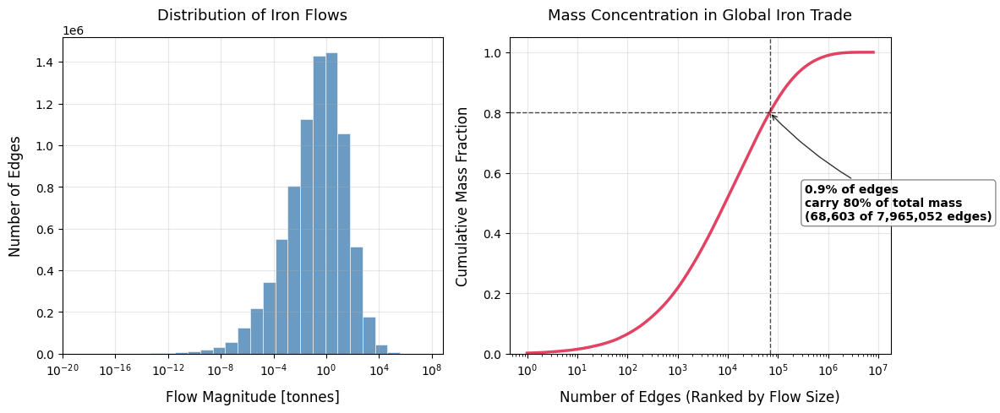

In [26]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_1_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

bilateral_dfs = []
bilateral_metrics = []
regional_metrics = []
year_list = list(range(2016, 2017, 1))

for year in year_list:
    # fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time=year)
    # fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
    # fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
    # fn.plot_network_map(title="Fe Extraction to Production", radius=3, color="darkblue", bins=[1, 15, 30, 60, 100, np.inf], labels=['<15', '15–30', '30–60', '60–100', '>100'], coverage=0.8, edge_alpha=0.3, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s1_{year}_v5.png", central_longitude=163)
    fig1 = fn.plot_flow_histogram(min_flow_threshold=0, figsize=(12, 5))


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload

=== KEY STATISTICS FOR MANUSCRIPT ===
Total edges analyzed: 7,956,533
Flow size range: 2.50e-39 to 1.34e+06 tons
Edges carrying 80% of mass: 287,529 (3.6%)
Mass concentration ratio: 1:28


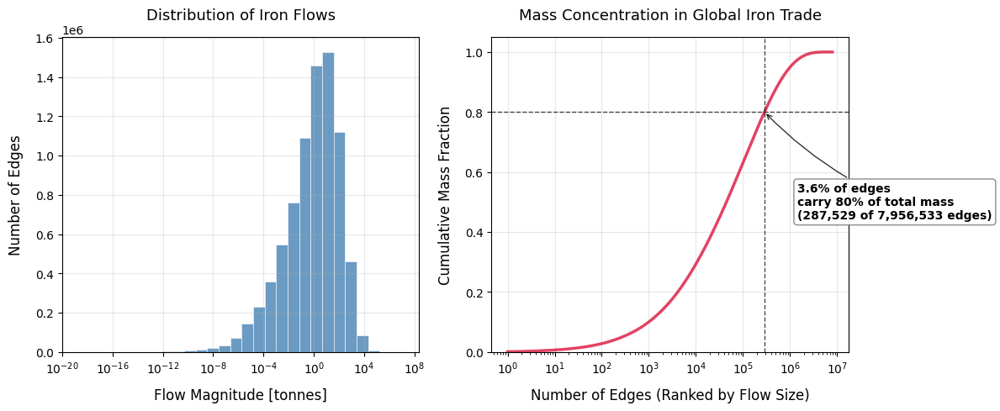

In [27]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_2_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

bilateral_dfs = []
bilateral_metrics = []
regional_metrics = []
year_list = list(range(2016, 2017, 1))

for year in year_list:
    # fn2 = FlowNetwork(grid_data_path, 'source_2_adj', 'sink_2_adj', time=year)
    # fn2.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
    # fn2.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
    # fn2.plot_network_map(title="Fe Production to In-use", radius=3, color="darkblue", bins=[0, 15, 30, 60, 100, np.inf], labels=['<15', '15–30', '30–60', '60–100', '>100'], coverage=0.8, edge_alpha=0.3, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s2_{year}_v5.png", central_longitude=163)
    fig2 = fn2.plot_flow_histogram(min_flow_threshold=0, figsize=(12, 5))
    

In [67]:
def overlay_flow_comparison(fn1, fn2, labels=['Extraction→Production', 'Production→In-use'], 
                           colors=['steelblue', 'coral'], figsize=(12, 5)):
    """
    Simple overlay of two flow networks on the same plot
    """
    # Create figure and axes
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Plot both networks on the same axes
    for i, (fn, label, color) in enumerate(zip([fn1, fn2], labels, colors)):
        # Get flow data - no filtering
        ds_flow = fn._gridded_inflow_outflow()
        flow = ds_flow["flow"].values
        flow_clean = np.where(np.isfinite(flow), flow, np.nan)
        vals = flow_clean.reshape(-1)
        vals = vals[~np.isnan(vals)]
        vals_pos = vals[vals > 0]  # Only positive flows, no threshold
        
        # Calculate mass concentration statistics
        sorted_vals = np.sort(vals_pos)[::-1]
        cumulative_mass = np.cumsum(sorted_vals) / np.sum(sorted_vals)
        
        # Find the 80% mass threshold
        idx_80 = np.searchsorted(cumulative_mass, 0.8)
        n_edges_80 = idx_80 + 1
        total_edges = len(vals_pos)
        percent_edges = (n_edges_80 / total_edges) * 100
        
        # Left panel: Distribution (log bins)
        bins = np.logspace(np.log10(vals_pos.min()), np.log10(vals_pos.max()), 50)
        ax1.hist(vals_pos, bins=bins, color=color, edgecolor='white',
                alpha=0.7, linewidth=0.5, label=label)
        
        # Right panel: Mass concentration with annotation
        ax2.semilogx(range(1, len(cumulative_mass) + 1), cumulative_mass,
                    color=color, linewidth=2.5, alpha=0.8, label=label)
        
        # Add 80% mass line and annotation for each network
        ax2.axhline(y=0.8, color=color, linestyle='--', alpha=0.5, linewidth=1)
        ax2.axvline(x=n_edges_80, color=color, linestyle='--', alpha=0.5, linewidth=1)
        
        # Better positioned annotations - moved further right/left
        if i == 0:  # Extraction→Production (0.9%)
            # Position to the RIGHT of the vertical line
            ax2.annotate(f'{label}\n{percent_edges:.1f}% of edges\ncarry 80% of mass',
                        xy=(n_edges_80, 0.8), 
                        xytext=(n_edges_80 * 0.05, 0.9),
                        arrowprops=dict(arrowstyle='->', color=color, alpha=0.7),
                        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=color, alpha=0.8),
                        ha='right', va='center', fontsize=12)
        else:  # Production→In-use (3.6%)
            # Position to the LEFT of the vertical line  
            ax2.annotate(f'{label}\n{percent_edges:.1f}% of edges\ncarry 80% of mass',
                        xy=(n_edges_80, 0.8), 
                        xytext=(n_edges_80 * 0.02, 0.6),
                        arrowprops=dict(arrowstyle='->', color=color, alpha=0.7),
                        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=color, alpha=0.8),
                        ha='right', va='center', fontsize=12)
    
    # Style the axes
    ax1.set_xscale('log')
    ax1.set_xlim(1e-20, None)
    ax1.tick_params(axis='x', labelsize=14)
    ax1.tick_params(axis='y', labelsize=14)
    ax1.set_xlabel('Flow Magnitude [tonnes]', fontsize=14)
    ax1.set_ylabel('Number of Edges', fontsize=14)
    ax1.set_title('Distribution of Iron Flows', fontsize=16)
    ax1.legend()
    # ax1.grid(True, alpha=0.3)
    
    ax2.tick_params(axis='x', labelsize=14)
    ax2.tick_params(axis='y', labelsize=14)
    ax2.set_xlabel('Number of Edges (Ranked by Flow Size)', fontsize=14)
    ax2.set_ylabel('Cumulative Mass Fraction', fontsize=14)
    ax2.set_title('Mass Concentration in Global Iron Trade', fontsize=16)
#     ax2.legend()
    # ax2.grid(True, alpha=0.3)
    ax2.set_ylim(0, 1.05)
    
    plt.tight_layout()
    plt.show()
    return fig

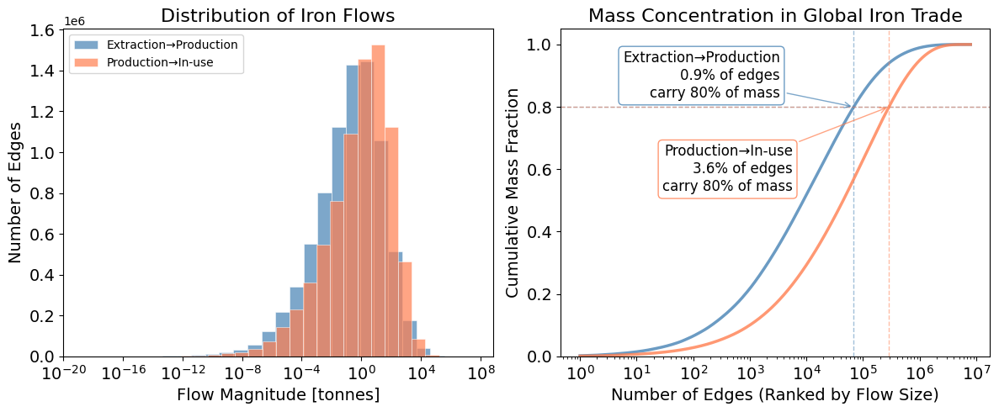

In [68]:
# Create comparison plot
comparison_fig = overlay_flow_comparison(fn, fn2)
comparison_fig.savefig(plot_path + 'iron_flow_comparison.pdf', 
                      bbox_inches='tight', 
                      dpi=600, 
                      format='pdf')
